In [ ]:
!pip install pytorch_lightning
!pip install pytorch_forecasting

In [2]:
import os
import warnings
warnings.filterwarnings("ignore")  # avoid printing out absolute paths
import copy
from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import pytorch_lightning as pl
from pytorch_lightning.callbacks import EarlyStopping, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger
from torch.utils.tensorboard import SummaryWriter
import torch
import os

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
os.chdir('drive/MyDrive/colab_insanity')

# Introduction
Reference this link:
`https://pytorch-forecasting.readthedocs.io/en/latest/tutorials/stallion.html`

And this paper:
`https://arxiv.org/pdf/1912.09363.pdf`

In [6]:
data = pd.read_csv("consolidated_tuna_data_clean.csv",thousands=',',decimal='.')

# eliminate the period, put in underscore
data.columns = data.columns.str.replace('.','_')

# add time index
data["time_idx"] = data["year"]* 12 + data["month"]
data["time_idx"] -= data["time_idx"].min()
data["month"] = data["month"].astype(str)
data["year"] = data["year"].astype(float)
data["skipjack_tuna_price"] = data["skipjack_tuna_price"].astype(float)
data["group"] = 1
data["group"] = data["group"].astype(str)
col_list = list(data.drop(columns=["group","time_idx","skipjack_tuna_price","year", "month"]).columns)

In [ ]:
data.head()

,year,month,ocean__temp_anomaly__00N_30N,ocean__total_error__00N_30N,ocean__high_error_variance__00N_30N,ocean__low_error_variance__00N_30N,ocean__bias_error_variance__00N_30N,ocean__diag_var_1__00N_30N,ocean__diag_var_2__00N_30N,ocean__diag_var_3__00N_30N,ocean__temp_anomaly__00N_90N,ocean__total_error__00N_90N,ocean__high_error_variance__00N_90N,ocean__low_error_variance__00N_90N,ocean__bias_error_variance__00N_90N,ocean__diag_var_1__00N_90N,ocean__diag_var_2__00N_90N,ocean__diag_var_3__00N_90N,ocean__temp_anomaly__20N_90N,ocean__total_error__20N_90N,ocean__high_error_variance__20N_90N,ocean__low_error_variance__20N_90N,ocean__bias_error_variance__20N_90N,ocean__diag_var_1__20N_90N,ocean__diag_var_2__20N_90N,ocean__diag_var_3__20N_90N,ocean__temp_anomaly__20S_20N,ocean__total_error__20S_20N,ocean__high_error_variance__20S_20N,ocean__low_error_variance__20S_20N,ocean__bias_error_variance__20S_20N,ocean__diag_var_1__20S_20N,ocean__diag_var_2__20S_20N,ocean__diag_var_3__20S_20N,ocean__temp_anomaly__30N_60N,ocean__total_error__30N_60N,ocean__high_error_variance__30N_60N,ocean__low_error_variance__30N_60N,ocean__bias_error_variance__30N_60N,ocean__diag_var_1__30N_60N,...,standarddeviation_rhoao_air_density_over_the_oceans,standarddeviation_shts_significant_height_of_total_swell,standarddeviation_shww_significant_height_of_wind_waves,standarddeviation_swh_significant_height_of_combined_wind_waves_and_swell,standarddeviation_swh1_significant_wave_height_of_first_swell_partition,standarddeviation_swh2_significant_wave_height_of_second_swell_partition,standarddeviation_swh3_significant_wave_height_of_third_swell_partition,standarddeviation_sea_surface_temperature,standarddeviation_surface_pressure,standarddeviation_tauoc_normalized_stress_into_ocean,standarddeviation_tmax_period_corresponding_to_maximum_individual_wave_height,standarddeviation_total_precipitation,standarddeviation_wdw_wave_spectral_directional_width,standarddeviation_wind_10_metre_wind_speed,standarddeviation_wmb_model_bathymetry,standarddeviation_wsk_wave_spectral_kurtosis,standarddeviation_wsp_wave_spectral_peakedness,standarddeviation_wss_wave_spectral_skewness,standarddeviation_wstar_free_convective_velocity_over_the_oceans,extent_______n,extent_______s,area_______n,area_______s,seafood_fresh_frozen_processing_ppi,skipjack_tuna_price,fao_food_price_index,fao_meat_price_index,fao_dairy_price_index,global_fish_price_index,import_price_index_fish_shellfish,global_price_of_shrimp_x,global_price_of_shrimp_y,domestic_air_cargo_volume,atlantic_air_cargo_volume,latam_air_cargo_volume,pacific_air_cargo_volume,international_air_cargo_volume,total_air_cargo_volume,time_idx,group
0,2011.0,1,0.042499,0.007314,0.000611,0.000011,0.006692,0.183191,0.207909,0.024718,0.290972,0.005454,0.000225,0.000005,0.005225,0.138691,0.144308,0.015000,0.492440,0.004324,0.000538,0.000007,0.003779,0.131266,0.108066,0.023200,-0.135003,0.008660,0.000944,0.000002,0.007714,0.237294,0.268025,0.030730,0.389095,0.008410,0.002730,0.000025,0.005655,0.149559,...,0.079768,0.674085,0.631971,0.895880,0.644852,0.285471,0.189628,11.479769,9328.997440,0.019431,1.197855,0.002918,0.102431,1.954787,293.738352,0.006908,0.466934,0.008007,0.299015,13.46,4.51,11.83,3.05,228.3,1515.0,133.7,97.6,122.8,6.795619,119.6,7.616397,7.616397,923.950,562.053,136.695,726.570,2691.53,5040.80,0,1
1,2011.0,2,0.075674,0.005971,0.000225,0.000011,0.005735,0.167386,0.180305,0.015000,0.195807,0.005514,0.000991,0.000005,0.004518,0.108472,0.139951,0.031479,0.305567,0.003619,0.000234,0.000007,0.003378,0.145450,0.130145,0.015306,-0.070447,0.007081,0.000225,0.000002,0.006854,0.239811,0.242997,0.015000,0.270976,0.005237,0.000225,0.000025,0.004987,0.122733,...,0.077140,0.690660,0.725356,0.982967,0.679071,0.275566,0.199891,11.570500,9495.331822,0.019329,1.147294,0.002736,0.109426,2.126233,293.738352,0.007191,0.461330,0.008207,0.274791,14.36,2.52,12.76,1.86,228.6,1590.0,137.6,100.3,130.3,6.976645,119.3,7.410835,7.410835,853.268,559.454,132.807,614

In [7]:
max_prediction_length = 1
max_encoder_length = 24
training_cutoff = data["time_idx"].max() - max_prediction_length

training = TimeSeriesDataSet(
    data[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="skipjack_tuna_price",
    group_ids=["group"],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    time_varying_known_categoricals=["month"],
    time_varying_known_reals=["year"],
    time_varying_unknown_reals=col_list,
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True
)

validation = TimeSeriesDataSet.from_dataset(training, data, predict=False, stop_randomization=True)
# create dataloaders for model
batch_size = 32  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)


In [8]:
# network with optimized hyperparams
pl.seed_everything(111)
checkpoint_callback = pl.callbacks.ModelCheckpoint(monitor='val_loss')

trainer = pl.Trainer(
    gpus=-1,
    auto_select_gpus=True,
    auto_scale_batch_size = 'binsearch',
    checkpoint_callback = True,
    callbacks = [checkpoint_callback],
    gradient_clip_val=0.50,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.09,
    hidden_size=9,  # most important hyperparameter apart from learning rate
    attention_head_size=4,
    dropout=0.11,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    output_size=7,  # 7 quantiles by default
    loss=QuantileLoss(),
    # reduce learning rate if no improvement in validation loss after x epochs
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

Global seed set to 111
GPU available: True, used: True
TPU available: False, using: 0 TPU cores


Number of parameters in network: 207.6k


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 72    
3  | prescalers                         | ModuleDict                      | 7.0 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 1.2 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 200 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 908   
7  | static_context_variable_selection  | GatedResidualNetwork            | 378   
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 378   
9  | static_context_initial_cell_lstm 

Restored states from the checkpoint file at /content/drive/My Drive/colab_insanity/lr_find_temp_model.ckpt


suggested learning rate: 1.8197008586099834e-05


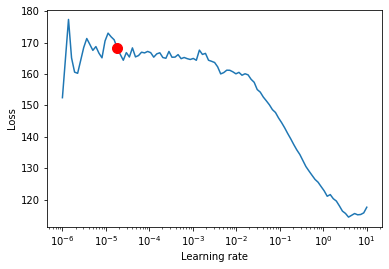

In [ ]:
# find optimal learning rate
res = trainer.tuner.lr_find(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
)

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [ ]:
# create hyperparameter study
study = optimize_hyperparameters(
    train_dataloader,
    val_dataloader,
    model_path="optuna_test3",
    n_trials=50,
    max_epochs=50,
    gradient_clip_val_range=(0.01, 1.0),
    hidden_size_range=(8, 30),
    hidden_continuous_size_range=(8, 30),
    attention_head_size_range=(1, 4),
    learning_rate_range=(0.01, 1.0),
    dropout_range=(0.05, 0.3),
    trainer_kwargs=dict(limit_train_batches=0.10), # only 10% of the training batches should be run
    reduce_on_plateau_patience=4,
    use_learning_rate_finder=False  # use Optuna to find ideal learning rate or use in-built learning rate finder
)

# show best hyperparameters
print(study.best_trial.params)

* `gradient_clip_val`: 0.16916274051721247
* `hidden_size`: 9
* `dropout`: 0.1079689348250811
* `hidden_continuous_size`: 8
* `attention_head_size`: 4
* `learning_rate`: 0.8268825031391938

In [9]:
# fit network
trainer.fit(
    tft,
    train_dataloader=train_dataloader,
    val_dataloaders=val_dataloader    
)

trainer.save_checkpoint("example91.ckpt")

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 72    
3  | prescalers                         | ModuleDict                      | 7.0 K 
4  | static_variable_selection          | VariableSelectionNetwork        | 1.2 K 
5  | encoder_variable_selection         | VariableSelectionNetwork        | 200 K 
6  | decoder_variable_selection         | VariableSelectionNetwork        | 908   
7  | static_context_variable_selection  | GatedResidualNetwork            | 378   
8  | static_context_initial_hidden_lstm | GatedResidualNetwork            | 378   
9  | static_context_initial_cell_lstm 

In [10]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

## Post Processing - Performance Evaluation

In [11]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
actuals = torch.cat([y for x, (y, weight) in iter(val_dataloader)])
baseline_predictions = Baseline().predict(val_dataloader)
(actuals - baseline_predictions).abs().mean().item()

119.71074676513672

In [12]:
# calcualte mean absolute error on validation set
actuals = torch.cat([y[0] for x, y in iter(val_dataloader)])
predictions = best_tft.predict(val_dataloader)
(actuals - predictions).abs().mean()

tensor(194.1126)

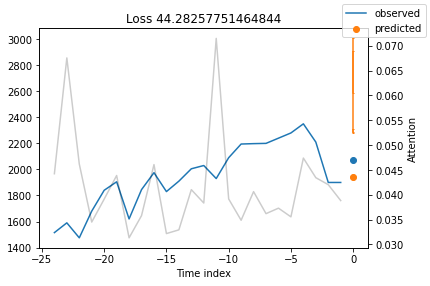

In [13]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions, x = best_tft.predict(val_dataloader, mode="raw", return_x=True)
best_tft.plot_prediction(x, raw_predictions, idx=0, add_loss_to_title=True);

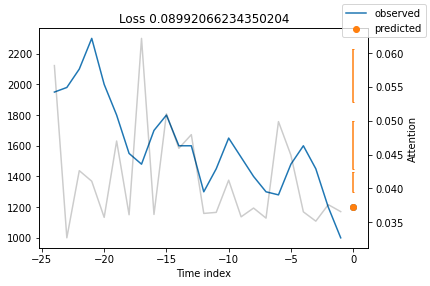

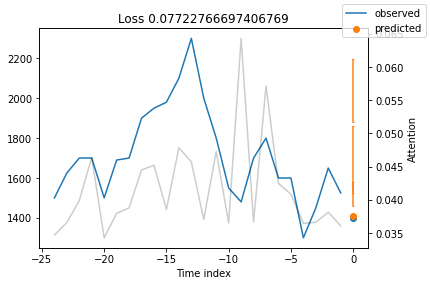

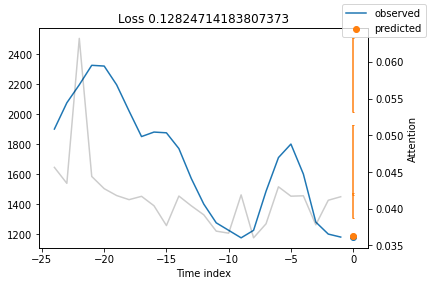

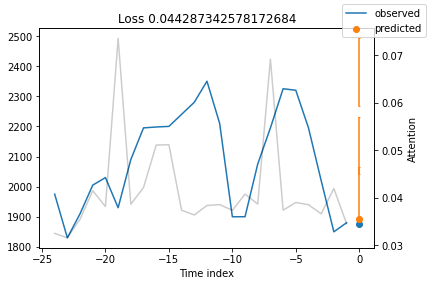

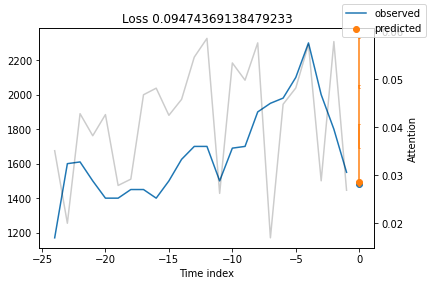

In [19]:
predictions = best_tft.predict(val_dataloader)
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)
indices = mean_losses.argsort(descending=False)  # sort losses
for idx in range(5):  # plot 10 examples
    best_tft.plot_prediction(
        x, raw_predictions, idx=indices[idx], add_loss_to_title=SMAPE(quantiles=best_tft.loss.quantiles)
    );

### Sample Predictions -- Worst Performers

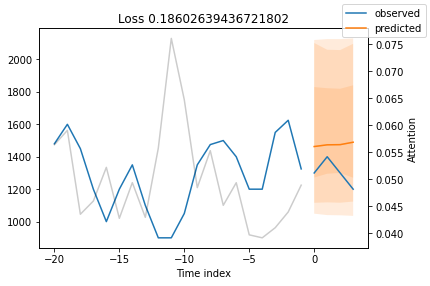

In [ ]:
# calcualte metric by which to display
predictions = best_tft.predict(val_dataloader)
mean_losses = SMAPE(reduction="none")(predictions, actuals).mean(1)
indices = mean_losses.argsort(descending=True)  # sort losses
for idx in range(1):  # plot 10 examples
    best_tft.plot_prediction(
        x, raw_predictions, idx=indices[idx], add_loss_to_title=SMAPE(quantiles=best_tft.loss.quantiles)
    );

### Actuals vs. Predictions by Variables

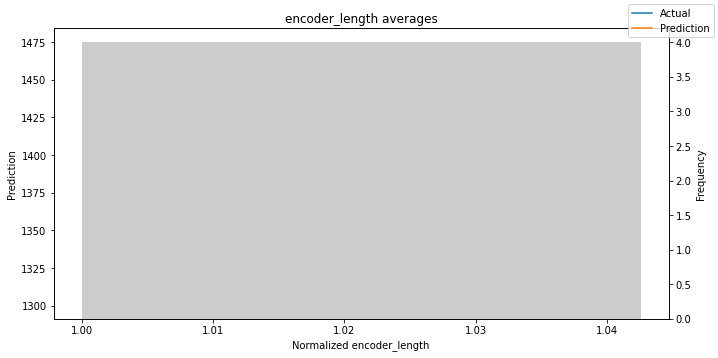

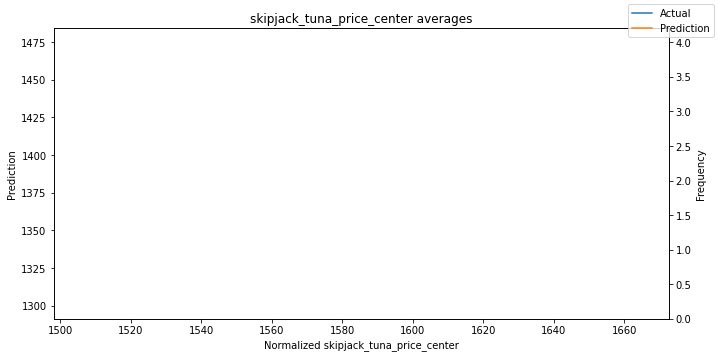

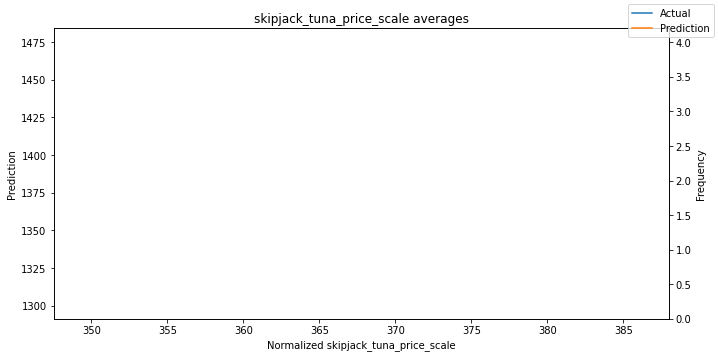

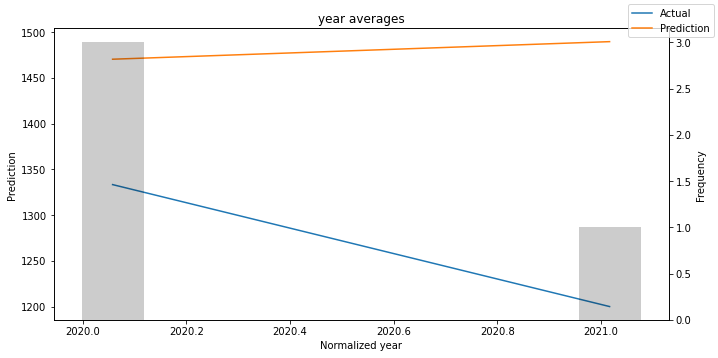

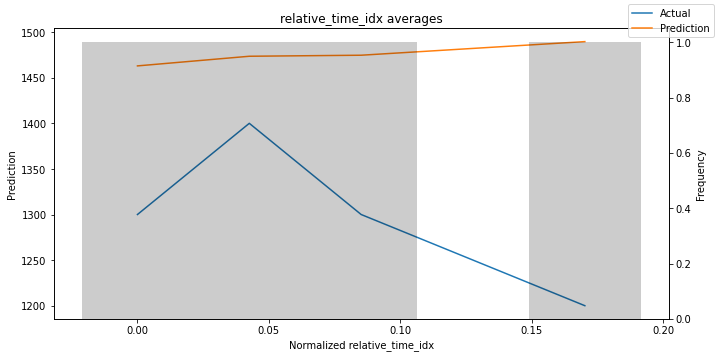

...

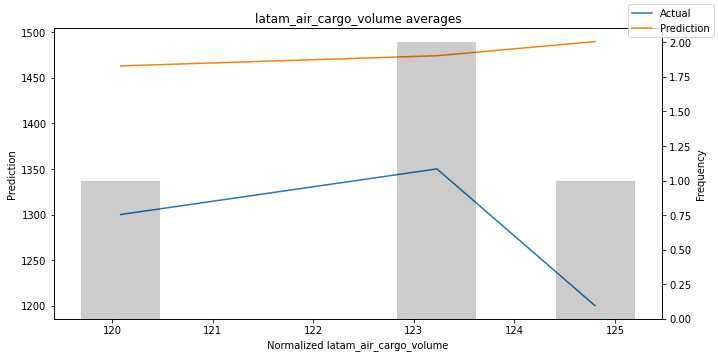

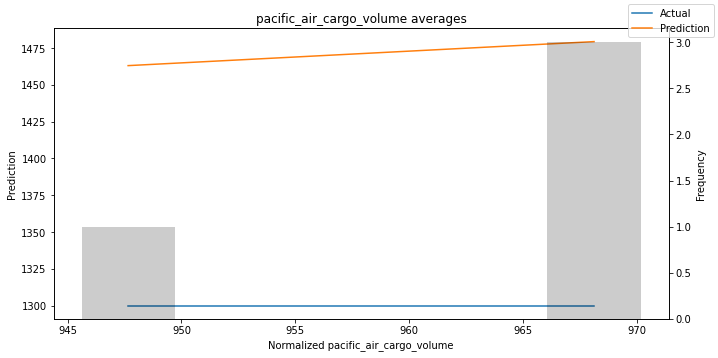

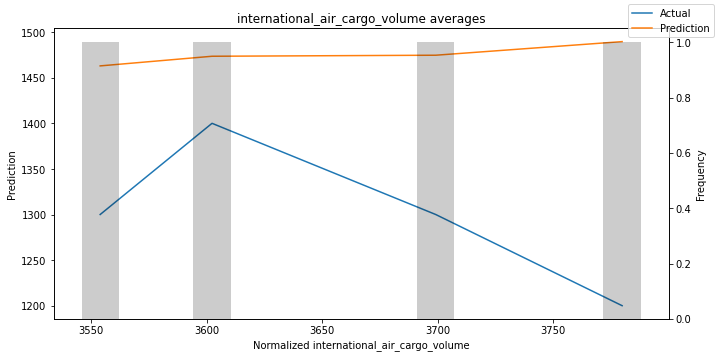

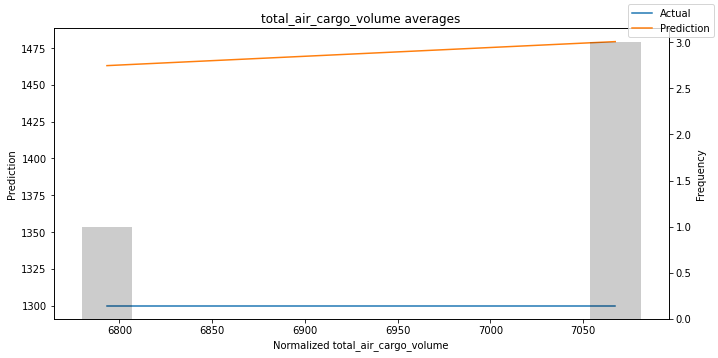

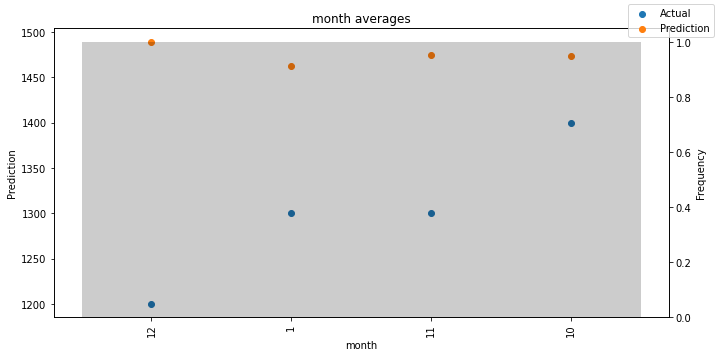

In [ ]:
predictions, x = best_tft.predict(val_dataloader, return_x=True)
predictions_vs_actuals = best_tft.calculate_prediction_actual_by_variable(x, predictions)
best_tft.plot_prediction_actual_by_variable(predictions_vs_actuals);

### Interpret The Model

{'attention': <Figure size 432x288 with 1 Axes>,
 'decoder_variables': <Figure size 504x198 with 1 Axes>,
 'encoder_variables': <Figure size 504x7938 with 1 Axes>,
 'static_variables': <Figure size 504x198 with 1 Axes>}

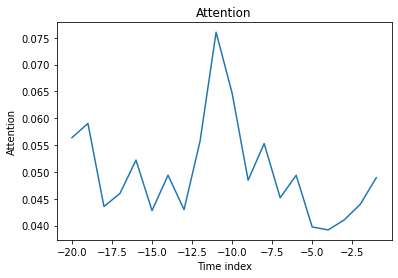

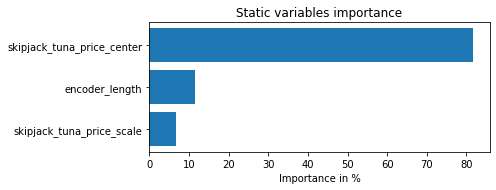

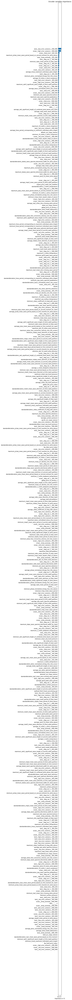

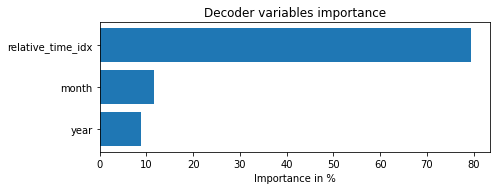

In [ ]:
interpretation = best_tft.interpret_output(raw_predictions, reduction="sum")
best_tft.plot_interpretation(interpretation)